# <font color='black'> Auto Insurance Fraud Detection</font>

## Table of Contents

2. [Visualizations](#b_ID)
    
    2.2 [Bivariate Analysis (Continued)](#b2_ID)
    
    2.3 [Correlation Analysis](#b3_ID)
    
    2.4 [Factorizing Categorical Attributes](#b4_ID)
    
3. [Exploratory Analysis](#c_ID)

    3.1 [K-Means Clustering](#c1_ID)

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## <a id='b_ID'> 2. Visualizations </a>

Count plots, histograms, boxplots, violin plots, pair plots and scatter plots were used for visualizing the dataset for categorical, date, and numerical attributes in the dataset. Spearman correlation among the features were illustrated in a heatmap and clustermap. Then, categorical features were factorized for later steps.

### <a id='b2_ID'> 2.2 Bivariate Analysis (Continued) </a>

#### Pair Plots with Scatterplots

In [37]:
# Visualize relationship between independent and dependent variables by classes
sns.pairplot(insurance_claims, height=5, hue="fraud_reported")

### <a id='b3_ID'> 2.3 Correlation Analysis </a>

Since the histograms showed nonparametric distributions for the attributes in the dataset, Spearman correlation was chosen over Pearson correlation.

#### Spearman Correlation 

In [45]:
corr_spearman = insurance_claims.corr(method='spearman')
corr_spearman

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
months_as_customer,1.000000,0.912725,0.016145,0.020084,0.004919,0.012951,-0.005428,0.013624,0.075522,0.015879,...,0.052744,0.063605,0.025255,0.048206,0.004376,-0.046236,-0.010224,0.052065,-0.048176,-0.000433
age,0.912725,1.000000,0.022527,0.030759,0.001981,0.008522,-0.020973,0.001411,0.095261,0.020714,...,0.065135,0.074304,0.055536,0.051485,0.005606,-0.035675,-0.002090,0.050853,-0.042561,0.004757
policy_deductable,0.016145,0.022527,1.000000,0.003461,0.001609,-0.004514,0.028327,-0.024865,0.066797,0.044657,...,0.019857,0.029569,0.056558,0.003857,0.024148,-0.051291,-0.020088,-0.017783,-0.030283,-0.027031
policy_annual_premium,0.020084,0.030759,0.003461,1.000000,-0.001056,0.043171,-0.015294,0.032233,-0.002511,-0.044377,...,-0.001634,-0.019166,-0.004412,0.007299,-0.029840,-0.001756,-0.009088,-0.031323,-0.047307,0.031728
umbrella_limit,0.004919,0.001981,0.001609,-0.001056,1.000000,0.004205,-0.042554,-0.020611,-0.021295,-0.025267,...,-0.041176,-0.047237,-0.017578,-0.038006,0.012026,0.058002,-0.042500,-0.019186,0.004097,-0.024242
insured_zip,0.012951,0.008522,-0.004514,0.043171,0.004205,1.000000,0.015023,0.041810,0.009845,0.013981,...,-0.002895,-0.008189,-0.014668,-0.016474,-0.027543,0.008555,0.032961,-0.033275,-0.031649,0.009333
capital-gains,-0.005428,-0.020973,0.028327,-0.015294,-0.042554,0.015023,1.000000,-0.041112,-0.016139,0.057753,...,0.012380,0.022957,0.005267,0.010284,0.027424,0.040781,0.028249,-0.009310,-0.035634,0.033642
capital-loss,0.013624,0.001411,-0.024865,0.032233,-0.020611,0.041810,-0.041112,1.000000,-0.029257,-0.017218,...,-0.042204,-0.045653,-0.023383,-0.040457,-0.054552,-0.025145,-0.027750,-0.027977,0.005318,-0.008113
incident_hour_of_the_day,0.075522,0.095261,0.066797,-0.002511,-0.021295,0.009845,-0.016139,-0.029257,1.000000,0.125927,...,0.178218,0.165724,0.169450,0.174234,0.020370,0.036253,0.009089,-0.013204,-0.006387,-0.018725
number_of_vehicles_involved,0.015879,0.020714,0.044657,-0.044377,-0.025267,0.013981,0.057753,-0.017218,0.125927,1.000000,...,0.210294,0.220973,0.221839,0.200743,0.039187,0.029497,-0.026052,0.000784,0.046145,-0.014813


#### Heatmaps

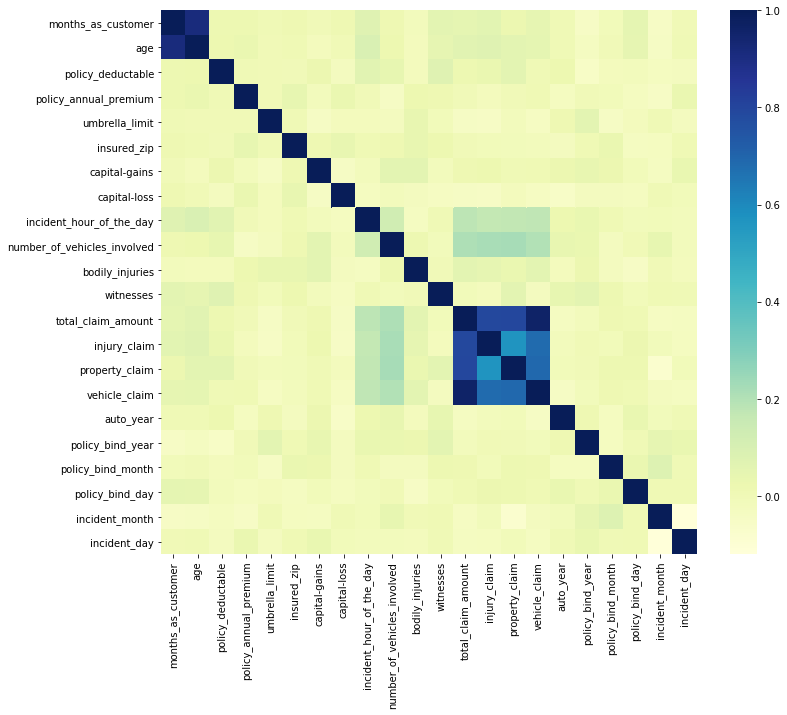

In [46]:
plt.figure(figsize = (12,10))
sns.heatmap(corr_spearman, cmap="YlGnBu")
plt.show()

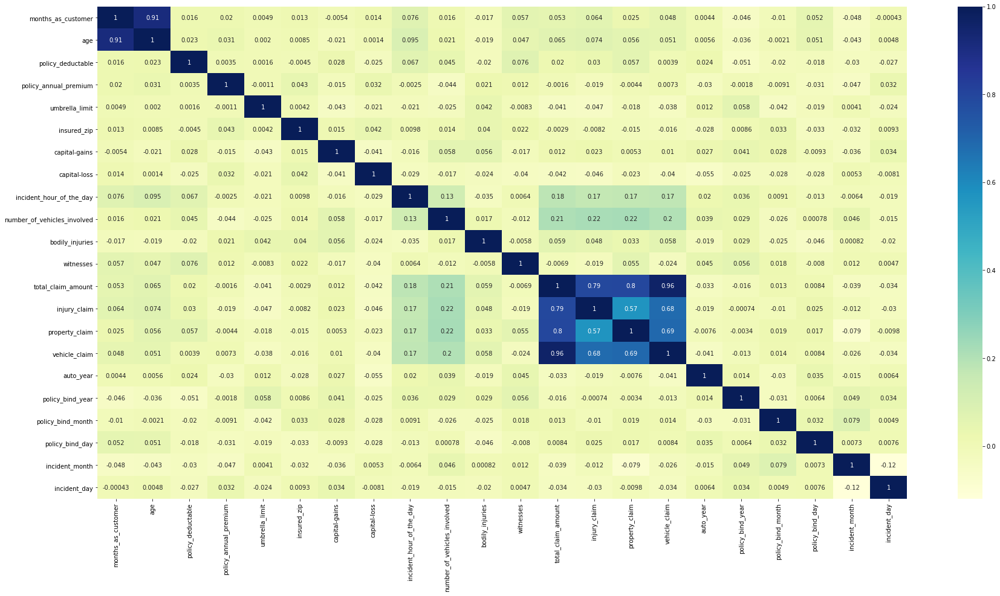

In [47]:
plt.figure(figsize = (30,15))
sns.heatmap(corr_spearman, cmap="YlGnBu", annot=True)
plt.show()

The above correlation heatmaps show like the pairplots:

**Postive Correlation**
* Strong correlation among 'months_as_customer' and 'age' with 0.91
* Stong correlation between 'vehicle_claim' and 'total_claim_amount'
* Strong to moderate correlation among 'total_claim_amount', 'injury_claim', 'property_claim', and 'vehicle_claim'
* Weak correlation with 'total_claim_amount', 'injury_claim', 'property_claim', and 'vehicle_claim' and 'incident_hour_of_day' and 'number_of_vehicles_involved'

**Negative Correlation**
* There are not any negative correlations in this dataset

#### Cluster Map

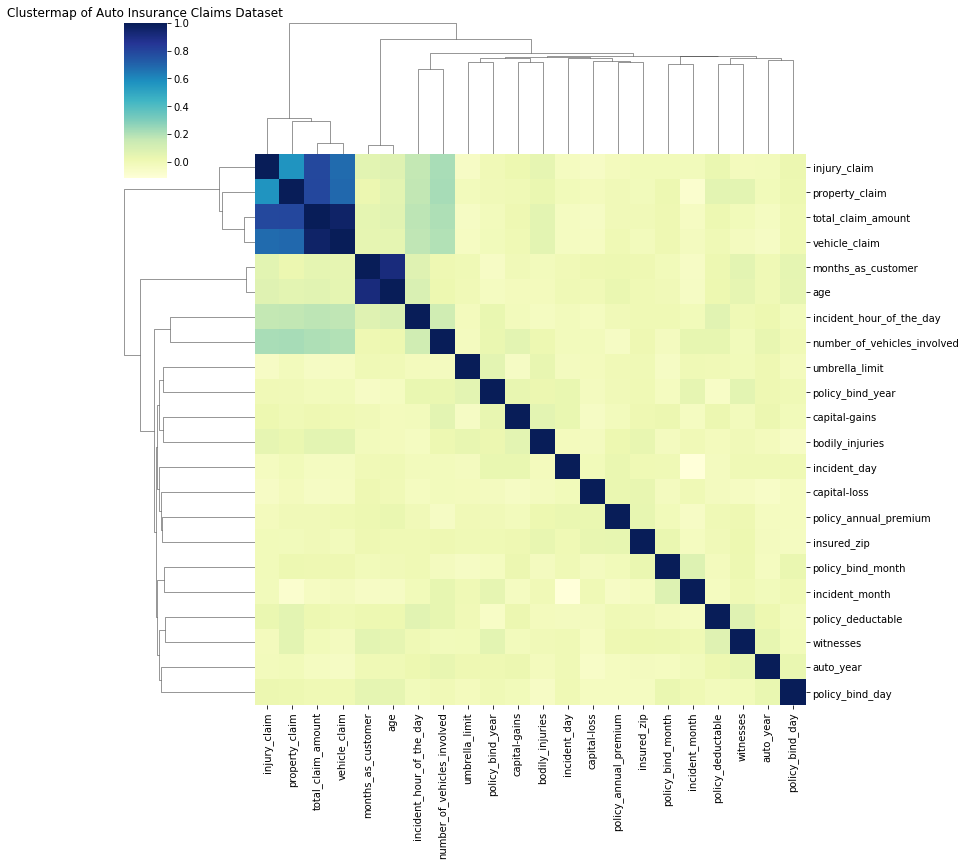

In [49]:
sns.clustermap(corr_spearman, cmap='YlGnBu', figsize = (12,12))
plt.title('Clustermap of Auto Insurance Claims Dataset')
plt.show()

The clustermap illustrated the data could be divided into different number of categories.  For example, the attributes could be divided into 3 categories:                       
1) 'injury_claim', 'property_claim', 'total_claim_amount', and 'vehicle_claim', 2) 'months_as_cutomer' and 'age', and 3) 'incident_hour_of_the_day' to 'policy_bind_day'.

### <a id='b4_ID'> 2.4 Factorizing Categorical Data </a>

Since some functions require a numerical data frame as an input, the categorical variables need to be factorized except for the target 'fraud_reported' variable.

In [25]:
# Make a copy of data frame
insurance_claims_fct = insurance_claims.copy()

In [26]:
insurance_claims_fct.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_bind_date             1000 non-null   datetime64[ns]
 3   policy_state                 1000 non-null   object        
 4   policy_csl                   1000 non-null   object        
 5   policy_deductable            1000 non-null   int64         
 6   policy_annual_premium        1000 non-null   float64       
 7   umbrella_limit               1000 non-null   int64         
 8   insured_zip                  1000 non-null   int64         
 9   insured_sex                  1000 non-null   object        
 10  insured_education_level      1000 non-null   object        
 11  insured_occupation           1000 non-null  

In [27]:
# Factorize 'continent', 'location', and 'tests_units' variables
insurance_claims_fct['policy_state'] = pd.Categorical(insurance_claims_fct['policy_state'], ordered=False).codes +1
insurance_claims_fct['policy_csl'] = pd.Categorical(insurance_claims_fct['policy_csl'], ordered=False).codes +1
insurance_claims_fct['insured_sex'] = pd.Categorical(insurance_claims_fct['insured_sex'], ordered=False).codes +1
insurance_claims_fct['insured_education_level'] = pd.Categorical(insurance_claims_fct['insured_education_level'], ordered=False).codes +1
insurance_claims_fct['insured_occupation'] = pd.Categorical(insurance_claims_fct['insured_occupation'], ordered=False).codes +1
insurance_claims_fct['insured_hobbies'] = pd.Categorical(insurance_claims_fct['insured_hobbies'], ordered=False).codes +1
insurance_claims_fct['insured_relationship'] = pd.Categorical(insurance_claims_fct['insured_relationship'], ordered=False).codes +1
insurance_claims_fct['incident_type'] = pd.Categorical(insurance_claims_fct['incident_type'], ordered=False).codes +1
insurance_claims_fct['collision_type'] = pd.Categorical(insurance_claims_fct['collision_type'], ordered=False).codes +1
insurance_claims_fct['incident_severity'] = pd.Categorical(insurance_claims_fct['incident_severity'], ordered=False).codes +1
insurance_claims_fct['authorities_contacted'] = pd.Categorical(insurance_claims_fct['authorities_contacted'], ordered=False).codes +1
insurance_claims_fct['incident_state'] = pd.Categorical(insurance_claims_fct['incident_state'], ordered=False).codes +1
insurance_claims_fct['incident_city'] = pd.Categorical(insurance_claims_fct['incident_city'], ordered=False).codes +1
insurance_claims_fct['incident_severity'] = pd.Categorical(insurance_claims_fct['incident_severity'], ordered=False).codes +1
insurance_claims_fct['property_damage'] = pd.Categorical(insurance_claims_fct['property_damage'], ordered=False).codes +1
insurance_claims_fct['police_report_available'] = pd.Categorical(insurance_claims_fct['police_report_available'], ordered=False).codes +1
insurance_claims_fct['incident_city'] = pd.Categorical(insurance_claims_fct['incident_city'], ordered=False).codes +1
insurance_claims_fct['auto_make'] = pd.Categorical(insurance_claims_fct['auto_make'], ordered=False).codes +1
insurance_claims_fct['auto_model'] = pd.Categorical(insurance_claims_fct['auto_model'], ordered=False).codes +1

Since we extracted information from the 'policy_bind_date' and 'incident_date', these columns could be dropped.

In [28]:
# Remove 'date' columns
insurance_claims_fct = insurance_claims_fct.drop('policy_bind_date', axis=1) 
insurance_claims_fct = insurance_claims_fct.drop('incident_date', axis=1)

In [29]:
print(insurance_claims_fct.info())
insurance_claims_fct.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   int8   
 3   policy_csl                   1000 non-null   int8   
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   int8   
 9   insured_education_level      1000 non-null   int8   
 10  insured_occupation           1000 non-null   int8   
 11  insured_hobbies              1000 non-null   int8   
 12  insured_relationship         1000 non-null   int8   
 13  capital-gains      

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
0,328,48,3,2,1000,1406.91,0,466132,2,5,...,52080,11,2,2004,Y,2014,10,17,1,25
1,228,42,2,2,2000,1197.22,5000000,468176,2,5,...,3510,9,13,2007,Y,2006,6,27,1,21
2,134,29,3,1,2000,1413.14,5000000,430632,1,7,...,23100,5,31,2007,N,2000,9,6,2,22
3,256,41,1,2,2000,1415.74,6000000,608117,1,7,...,50720,4,35,2014,Y,1990,5,25,1,10
4,228,44,1,3,1000,1583.91,6000000,610706,2,1,...,4550,1,32,2009,N,2014,6,6,2,17


There are 1000 records and 40 attributes in the data frame.

## <a id='c_ID'> 3. Exploratory Analysis </a>

### <a id='c1_ID'> 3.1 K-Means Clustering </a>

K-Means clustering would help divide the data points into groups where more similiar points are grouped together and data points from different clusters are disimiliar.

In [55]:
from sklearn.cluster import KMeans

In [56]:
# Make a copy of data frame
insurance_claims_fct2 = insurance_claims_fct.copy()

In [57]:
insurance_claims_fct2.replace('N', 0, inplace=True)
insurance_claims_fct2.replace('Y', 1, inplace=True)

In [58]:
kmeansModel2 = KMeans(n_clusters=2, random_state=1)
kmeansModel2.fit(insurance_claims_fct2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

In [59]:
kmeansModel2.cluster_centers_

array([[ 2.03836658e+02,  3.89600998e+01,  2.02119701e+00,
         1.94638404e+00,  1.13653367e+03,  1.25678217e+03,
         6.23441397e+03,  5.00806638e+05,  1.45760599e+00,
         3.98254364e+00,  7.62094763e+00,  1.08391521e+01,
         3.34164589e+00,  2.56985037e+04, -2.66193267e+04,
         2.15835411e+00,  2.67331671e+00,  2.17955112e+00,
         3.13965087e+00,  4.32044888e+00,  3.95885287e+00,
         1.16907731e+01,  1.85286783e+00,  1.96758105e+00,
         9.72568579e-01,  1.49251870e+00,  1.99501247e+00,
         5.32649501e+04,  7.54200748e+03,  7.44299252e+03,
         3.82799501e+04,  7.53117207e+00,  2.01895262e+01,
         2.00506733e+03,  2.35660848e-01,  2.00140025e+03,
         6.63216958e+00,  1.55723192e+01,  1.49625935e+00,
         1.50872818e+01],
       [ 2.04429293e+02,  3.88989899e+01,  1.98484848e+00,
         1.96969697e+00,  1.13383838e+03,  1.25488308e+03,
         5.53535354e+06,  5.02866485e+05,  1.48484848e+00,
         3.89898990e+00,  7.78

In [60]:
kmeansModel2.labels_

array([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [61]:
kmeansModel5 = KMeans(n_clusters=5, random_state=1)
kmeansModel5.fit(insurance_claims_fct2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

In [62]:
kmeansModel5.cluster_centers_

array([[ 2.03740926e+02,  3.89524406e+01,  2.02127660e+00,
         1.94493116e+00,  1.13642053e+03,  1.25649486e+03,
        -1.25156446e+03,  5.00964688e+05,  1.45932416e+00,
         3.98247810e+00,  7.61451815e+00,  1.08235294e+01,
         3.33792240e+00,  2.57490613e+04, -2.65740926e+04,
         2.15769712e+00,  2.67209011e+00,  2.18397997e+00,
         3.14643304e+00,  4.31789737e+00,  3.95744681e+00,
         1.17033792e+01,  1.85356696e+00,  1.96620776e+00,
         9.71214018e-01,  1.49311640e+00,  1.99374218e+00,
         5.32333292e+04,  7.53629537e+03,  7.44067584e+03,
         3.82563579e+04,  7.52816020e+00,  2.01627034e+01,
         2.00508385e+03,  2.34042553e-01,  2.00138548e+03,
         6.63579474e+00,  1.55456821e+01,  1.49687109e+00,
         1.51226533e+01],
       [ 2.21197674e+02,  4.04651163e+01,  1.96511628e+00,
         1.98837209e+00,  1.19186047e+03,  1.22716953e+03,
         6.33720930e+06,  5.03298674e+05,  1.50000000e+00,
         3.70930233e+00,  7.39

In [63]:
kmeansModel5.labels_

array([0, 3, 3, 1, 1, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 3, 1, 0, 0, 2, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 4, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 3, 1, 0, 0, 0, 2, 0,
       4, 0, 3, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 4, 0, 0, 0, 4, 2, 2, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1,
       0, 0, 0, 2, 0, 0, 2, 1, 1, 1, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 1, 0, 3, 0, 0, 0, 0, 1,
       0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 4, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 0, 0,
       1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

##### Visualizing K Means Clustering

In [64]:
print(insurance_claims_fct.columns[0])
print(insurance_claims_fct.columns[13])
print(insurance_claims_fct.columns[-6])

months_as_customer
capital-gains
fraud_reported


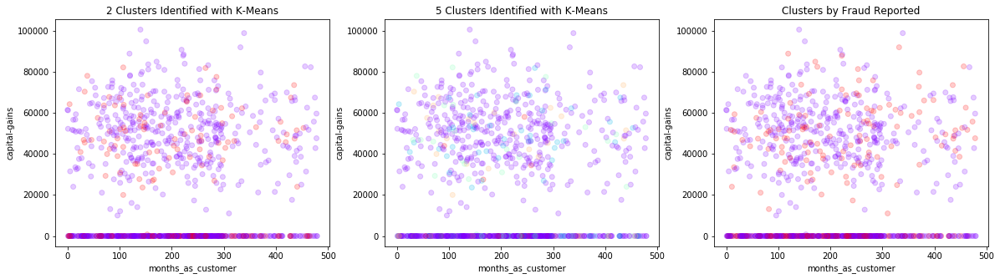

In [67]:
plt.figure(figsize=(20,5))
plt.subplot(1, 3, 1)
plt.scatter(insurance_claims_fct2.loc[:,'months_as_customer'], insurance_claims_fct2.loc[:,'capital-gains'], 
            c=kmeansModel2.labels_, cmap='rainbow', alpha=0.2)
plt.xlabel('months_as_customer')
plt.ylabel('capital-gains')
plt.title('2 Clusters Identified with K-Means')

plt.subplot(1, 3, 2)
plt.scatter(insurance_claims_fct2.loc[:,'months_as_customer'], insurance_claims_fct2.loc[:,'capital-gains'], 
            c=kmeansModel5.labels_, cmap='rainbow', alpha=0.2)
plt.xlabel('months_as_customer')
plt.ylabel('capital-gains')
plt.title('5 Clusters Identified with K-Means')

plt.subplot(1, 3, 3)
plt.scatter(insurance_claims_fct2.loc[:,'months_as_customer'], insurance_claims_fct2.loc[:,'capital-gains'], 
            c=insurance_claims_fct2.loc[:,'fraud_reported'], label=insurance_claims_fct2.loc[:,'fraud_reported'].unique(), cmap='rainbow', alpha=0.2)
plt.xlabel('months_as_customer')
plt.ylabel('capital-gains')
plt.title('Clusters by Fraud Reported')

plt.show()

Two clusters found using K-Means is more similar to the plot showing clusters by the Fraud Reported class attribute.  However, some records with fraud reported as 'Yes' were not identified using two clusters.  Using K-Means with five clusters, identified some data points where fraud was reported as 'Yes' as belonging to other clusters.